# Анализ рынка заведений общественного питания Москвы

### Описание проекта

<p></p>

Инвесторы из фонда «Shut Up and Take My Money» планируют открыть заведение общественного питания в Москве. Заказчики еще не определились с расположением и типом заведения, меню и ценовым диапазоном.<br>
Предоставлены данные с заведениями общественного питания Москвы, составленные на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.<br>
<b>Задача:</b> провести исследование рынка Москвы, выявить особенности и рекомендации, которые в будущем помогут в выборе подходящего инвесторам места.<br>

    
***Цели Исследования:***
- ознакомиться с данными и выполнить их предобработку(имена колонок, типы данных, пропуски, новые колонки) 
- провести исследовательский анализ данных, дав ответы на вопросы:
  - какие категории заведений представлены в данных? изучить из количество и распределение
  - исследовать количество посадочных мест по категориям
  - каких заведений больше: сетевых или несетевых? какие категории заведений чаще являются сетевыми?
  - найти и исследовать топ-15 популярных сетей в Москве
  - какие административные районы Москвы присутствуют в датасете?
  - изучить распределение средних рейтингов по категориям заведений
  - построить хороплет, найти топ-15 улиц по количеству заведений и улицы, на которых находится только один объект общепита
  - как удалённость от центра влияет на цены в заведениях?
- провести исследование для открытия кофейни, дав ответы на вопросы:
  - сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
  - есть ли круглосуточные кофейни?
  - какие у кофеен рейтинги? Как они распределяются по районам?
  - на какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
- подготовить презентацию исследования для инвесторов
- зафиксировать основной вывод исследования и предоставить общие рекомендации

### Описание данных: 

<p></p>
<div style="border:solid black 1px; padding: 20px">
Предоставлены данные о заведениях, расположенных в г.Москва.
Всего 8 406 строк в таблице с данными.<br>
Уникальных заведений - 5501 объект.<br>
Заведения представлены в 8 категориях и 9 административных округах города.<br>
Также у нас есть информация о координатах заведения, адресе, числе посадочных мест, времени работы, рейтинге, среднем чеке и является ли заведение сетевым или нет.<br>
</div>

## Импорт данных и предобработка 

In [1]:
# установка библиотеки
!pip install geopy

     |████████████████████████████████| 119 kB 2.5 MB/s eta 0:00:01
     |████████████████████████████████| 40 kB 2.6 MB/s  eta 0:00:01


In [2]:
# импорт библиотек 
import pandas as pd;
import numpy as np;
import matplotlib.pyplot as plt;
import seaborn as sns;
import datetime as dt
from scipy import stats as st
import math as mth
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
from geopy.distance import geodesic as GD 

In [3]:
# отключить предупреждения
warnings.filterwarnings('ignore')

In [4]:
# чтение csv-файла
data = pd.read_csv('/datasets/moscow_places.csv')

In [5]:
# функция для знакомства с данными
def get_info(df, n):
    return (
            df.info(),
            display(df.head(n)),
            print(f'Число дубликатов: {df.duplicated().sum()}'),
            print(f'Доля дубликатов: {df.duplicated().sum()/len(df)*100}'),
            );


# вывод основной информации data
display(get_info(data, 5));

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Число дубликатов: 0
Доля дубликатов: 0.0


(None, None, None, None)

*Названия у столбцов представлены корректно*

### Пропуски

In [6]:
# определение доли пропусков от общего числа строк в каждом столбце
pd.DataFrame(round(data.isna().mean()*100, 2)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.380000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.560000
avg_bill,54.600000


В 6 столбцах обнаружены пропуски, их доля достаточно велика для того, чтобы удалить этот срез строк.  
Обрабатывать пропуски также нецелесообразно, так как это будет простой заглушкой и может исказить дальнейший анализ.  

### Дубликаты

*Займемся поиском дубликатов*

In [7]:
# вывод уникальных значений категорий
display(data['category'].unique())

# вывод уникальных значений районов
display(data['district'].unique())

# вывод уникальных значений сетки
data['chain'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

array([0, 1])

В столбцах с категориями и районами дубликатов не обнаружено. Изучим столбец с названиями заведений.

In [8]:
# создание функции для преобразования названий заведений
def clean_name(df):
    df = df.lower()   # приведение к нижнему регистру
    df = df.strip()   # удаление пробелов в названиях
    df = df.replace('ё','е') 
    df = df.replace(' & ', '&') 
    df = df.replace('№ ', '№')
    return df

data['name'] = data['name'].apply(clean_name)

In [9]:
# поиск дубликатов по 3 столбцам
data.loc[data.duplicated(subset=['name', 'category', 'address'], keep=False
                         )]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Найден дубликат: ресторан more poke, адрес и координаты схожи. Разница лишь в часах работы: в строке 1511 время работы расписано подробнее, а также в первом случае - несетевое заведение, а во втором - сетевое.  
Найдем в таблице другие строки с этим заведением и посмотрим на значение в столбце chain.

In [10]:
# срез строки с заведениями more poke
data.query('name=="more poke"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


Удалим строку 1430, так как она является дубликатом строки 1511.

In [11]:
# удаление дубликата
data = data.drop_duplicates(subset=['name', 'category', 'address'],
                         keep='last')

# срез строки с заведениями more poke
data.query('name=="more poke"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


In [12]:
# изучение данных
print(f"Число уникальных заведений на рынке Москвы: {data['name'].nunique()}")
print(f"Они представлены в {data['category'].nunique()} категориях")
print(f"{len(data.query('chain==1'))} - сетевые, {len(data.query('chain==0'))} - несетевые")
print(f"Расположены в {data['district'].nunique()} различных районах города")

Число уникальных заведений на рынке Москвы: 5501
Они представлены в 8 категориях
3205 - сетевые, 5200 - несетевые
Расположены в 9 различных районах города


### Добавление новых столбцов

In [13]:
# создание функции для получения улицы
def get_street(row):
    arr_address = row['address'].split(', ')
    street = arr_address[1]
    return street

# применение функции и создание нового столбца с улицей заведения
data['street'] = data.apply(get_street, axis=1)

# вывод случайных строк
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
5941,g. bakery8,кофейня,"Москва, улица Кржижановского, 4, корп. 1",Юго-Западный административный округ,"ежедневно, 07:00–22:00",55.682725,37.561794,4.8,средние,Средний счёт:100–300 ₽,200.0,NaN,0,100.0,улица Кржижановского
4394,бардак,кафе,"Москва, улица Маросейка, 6-8с1",Центральный административный округ,"ежедневно, 12:00–23:00",55.757307,37.634379,4.6,NaN,NaN,NaN,NaN,0,NaN,улица Маросейка
6320,платформа 9 3/4,кофейня,"Москва, Автозаводская улица, 23Б, корп. 2",Южный административный округ,"ежедневно, 10:00–22:00",55.700710,37.651082,3.4,NaN,NaN,NaN,NaN,0,50.0,Автозаводская улица
7569,бункер кафе,кофейня,"Москва, Ясногорская улица, 17, корп. 1",Юго-Западный административный округ,"ежедневно, 09:00–20:00",55.602167,37.533190,4.8,NaN,Цена чашки капучино:100–150 ₽,NaN,125.0,0,NaN,Ясногорская улица
3364,кафе узбекской кухни,быстрое питание,"Москва, улица Ермакова Роща, 7А, стр. 3",Центральный административный округ,"ежедневно, 09:00–21:00",55.758504,37.529546,4.4,NaN,NaN,NaN,NaN,0,NaN,улица Ермакова Роща


In [14]:
# создание функции для определения круглосуточных заведений
def around_the_clock(row):
    if row['hours'] == 'ежедневно, круглосуточно':
        schedule = True
    else:
        schedule = False
    return schedule

# применение функции и создание нового столбца (True - круглосуточно)
data['is_24/7'] = data.apply(around_the_clock, axis=1)

# вывод случайных строк
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
6976,the wild bean cafe,кафе,"Москва, Профсоюзная улица, 67Ас1",Юго-Западный административный округ,"ежедневно, круглосуточно",55.650551,37.534538,4.1,NaN,NaN,NaN,NaN,1,NaN,Профсоюзная улица,True
2576,кофейная история,кофейня,"Москва, Большая Семёновская улица, 10, стр. 13",Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 10:00–20:00",55.782477,37.702322,5.0,NaN,Цена чашки капучино:119–149 ₽,NaN,134.0,0,NaN,Большая Семёновская улица,False
7375,гриль парк,кафе,"Москва, улица Марьинский Парк, 45",Юго-Восточный административный округ,NaN,55.672290,37.794451,4.2,NaN,NaN,NaN,NaN,1,NaN,улица Марьинский Парк,False
5508,мини-кулинария,"бар,паб","Москва, проспект Будённого, 15/2",Восточный административный округ,"ежедневно, 09:00–22:00",55.775628,37.723878,4.1,NaN,Средний счёт:100–300 ₽,200.0,NaN,0,NaN,проспект Будённого,False
7196,котофей,кафе,"Москва, Кантемировская улица, 58",Южный административный округ,NaN,55.639250,37.645727,4.1,NaN,NaN,NaN,NaN,0,10.0,Кантемировская улица,False


### Вывод после предобработки данных: 

<p></p>

<div style="border:solid pink 5px; padding: 20px">
<li>Данные содержат пропуски, которые затронули 6 столбцов. Пропуски не были заполнены, так как заполнение исказило бы дальнейший анализ. К тому же, эти параметры трудны в заполнении, велика возможность исказить реальную картину.</li>
<li>Найдены дубликаты в названиях заведений, они были обработаны. Также удалена одна строка-дубликат.</li>
<li>Названия столбцов и тип данных корректны.</li>    
<li>Добавлено 2 столбца: улица заведения и является ли оно круглосуточным.</li>
</div> 

## Анализ данных

### Распределение по категориям

In [15]:
# создание сводной таблицы с категориями и числом заведений
category = data.pivot_table(index='category', values='name', aggfunc='count')\
               .reset_index()\
               .sort_values(by='name', ascending=True)

category.columns = ['type', 'count']

In [16]:
# функция рассчета доли
def share_count(row):
    num = "{:.2%}".format(row['count']/category['count'].sum())
    return num

# добавление столбца доли 
category['share'] = category.apply(share_count, axis=1)
category

,type,count,share
1,булочная,256,3.05%
7,столовая,315,3.75%
2,быстрое питание,603,7.17%
5,пиццерия,633,7.53%
0,"бар,паб",765,9.10%
4,кофейня,1413,16.81%
6,ресторан,2042,24.30%
3,кафе,2378,28.29%


In [17]:
# создание столбчатой диаграммы распределения заведений по категориям
fig = px.bar(category, x='count', y='type')
fig.update_layout(title='Распределение заведений по категориям', xaxis_title='количество',
                  yaxis_title='')
fig.update_traces(marker_color='purple')
fig.show()

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>Заведения представлены в 8 категориях: булочная, столовая, быстрое питание, пиццерия; бар,паб; кофейня, ресторан, кафе.</li> 
    Заведения распределены неравномерно между категориями.<br>
<li>Наибольшую долю составляют кафе - 28%, следом рестораны - 24% и кофейни - 17%.</li>
<li>Меньше всего булочных и столовых - 3.1% и 3.8%.</li>  	
</div>

### Количество посадочных мест

In [18]:
# создание сводной таблицы с числом посадочных мест по категориям
seats = data.pivot_table(index='category', values='seats')\
               .reset_index()\
               .sort_values(by='seats', ascending=True)
               
seats['seats'] = seats['seats'].round()
seats

,category,seats
1,булочная,89.0
5,пиццерия,94.0
3,кафе,98.0
2,быстрое питание,99.0
7,столовая,100.0
4,кофейня,111.0
6,ресторан,122.0
0,"бар,паб",125.0


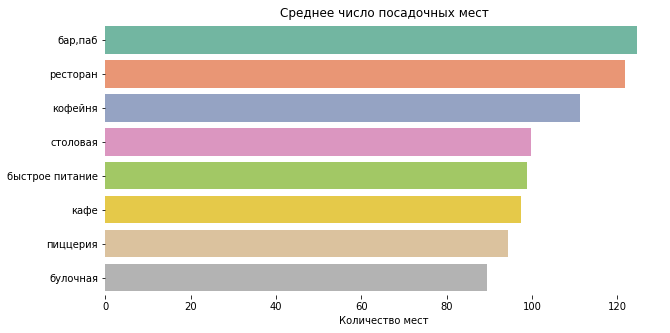

In [19]:
# построение диаграммы распределения посадочных мест в категориях
sns.set_palette('Set2')
plt.figure(figsize=(10,5))
ax = sns.barplot(x='seats', y='category', data=data, ci=None, 
                 order=["бар,паб", "ресторан",
                        "кофейня", "столовая", 
                        "быстрое питание", "кафе", 
                        "пиццерия", "булочная"])
ax.set_title('Среднее число посадочных мест')
ax.set_xlabel('Количество мест') 
ax.set_ylabel('')
sns.despine(left = True, bottom = True)
plt.show()

In [20]:
# распределение количества мест в заведениях
display(data.seats.describe(percentiles=[.1, .25, .50, .75, .90, .95, .99]))

display(len(data.query('seats>240')))
len(data.query('seats>625'))

count    4794.000000
mean      108.405090
std       122.840831
min         0.000000
10%        16.000000
25%        40.000000
50%        75.000000
75%       140.000000
90%       240.000000
95%       307.000000
99%       625.000000
max      1288.000000
Name: seats, dtype: float64

475

30

В данных есть заведениях, где нет посадочных мест вообще. Вероятно, это просто точка "to go".  
Есть объекты с числом мест - 1288.  
Не более 10% или 475 заведений имеют более 240 посадочных мест. И лишь 1% или 30 заведений - более 625 мест.  
Среднее число мест - 108, а медианное - 75, то есть много небольших заведений. На среднее оказали влияния выбросы.

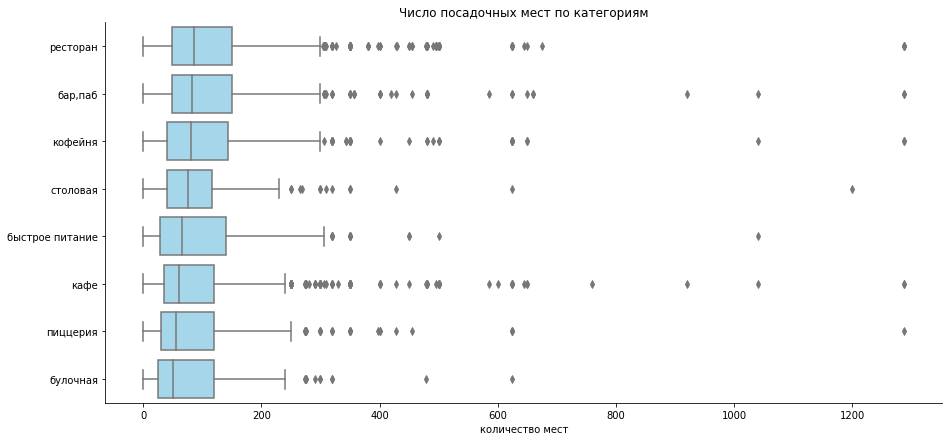

In [21]:
# построение графика распределения мест по категориям

ranks = data.groupby("category")["seats"].median().sort_values()[::-1].index

sns.set_palette('Set2')
plt.figure(figsize=(15,7))
ax = sns.boxplot(x="seats", y="category", data=data, color="#99DBF5",
                   order = ranks)
ax.set_title('Число посадочных мест по категориям')
ax.set_xlabel('количество мест') 
ax.set_ylabel('')
sns.despine()
plt.show()

Наибольшее медианное число посадочных мест - в ресторанах, барах и пабах, кофейнях.  
Наименьшее - в булочных и пиццериях.  
Много объектов разного размера можно встретить среди ресторанов, кофеен, баров и точек быстрого питания, у них большой разброс значений.  
Можно встретить кофейни, кафе, рестораны, пиццерии, бары, где число посадочных мест превышает 1200.

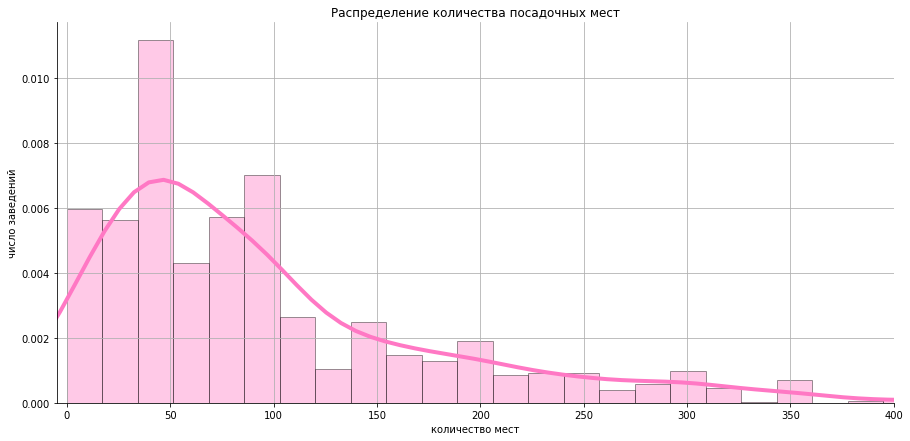

In [22]:
# распределение числа посадочных мест
plt.figure(figsize = (15, 7))
sns.distplot(data["seats"], hist=True, kde=True, 
             bins=75, color = '#FF78C4', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4}, label='ffh')
plt.title('Распределение количества посадочных мест')
plt.xlabel('количество мест') 
plt.ylabel('число заведений')
plt.grid()
plt.xlim(-5, 400)
sns.despine()
plt.show()

*На графике видно, что распределение числа мест имеет распределение, отличного от нормального, видна положительную ассиметрию и смещение влево, то есть правосторонняя ассиметрия и длинынй хвост справа.  
То есть в основном заведения имеют не более 100 посадочных мест, это небольшие, специализированные заведения.  
И также встречаются объекты, которые имеют до 240 мест, то есть средние по размеру заведения.  
Есть заведения с крайне большим числом мест - более 600, их доля не более 1%.*

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>В среднем большее число посадочных мест в барах и ресторанах, следом - кофейни и столовые.</li>	
<li>Если смотреть медианное распределение числа посадочных мест, то топ-4: ресторан, бар, кофейня, столовая</li>	
<li>Среднее число мест - 108, а медианное - 75. Есть заведения без посадочных мест и заведения с более чем 600 мест.</li>
<li>Основная доля объектов являются небольшими или средними по размеру - 50-200 мест.</li>  
</div>

### Соотношение сетевых и несетевых заведений 

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [23]:
chain = data.groupby('chain').agg({'name':'count'}).reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5200
1,1,3205


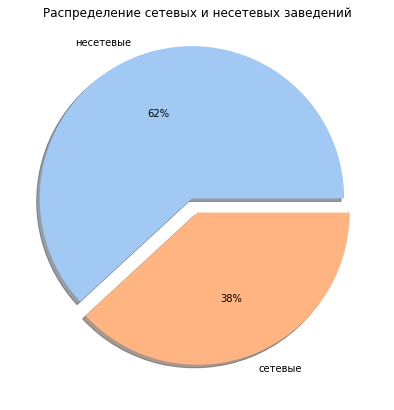

In [24]:
# создание круговой диаграммы
type_pie=['несетевые', 'сетевые']
sns.set_palette('pastel')
explode = (0.1, 0)
plt.figure(figsize=(7, 7))
plt.pie(chain['count'], labels=type_pie, autopct='%.0f%%', explode=explode,  shadow=True)
plt.title('Распределение сетевых и несетевых заведений')
plt.show()


Более 60% объектов - несетевые, то есть их доля преобладает. Изучим соотношение в разрезе типов заведений.

In [25]:
# создание сводной таблицы с числом сетевых заведений по категориям
chain_category = data.groupby('category').agg({'chain':'sum', 'name':'count'}).reset_index()

chain_category.columns = ['category', 'chain', 'total']
chain_category['share_ch'] = round(chain_category['chain']/chain_category['total']*100, 2)
chain_category.sort_values(by='share_ch', inplace=True)
chain_category['share_total'] = 100
chain_category

,category,chain,total,share_ch,share_total
0,"бар,паб",169,765,22.09,100
7,столовая,88,315,27.94,100
3,кафе,779,2378,32.76,100
6,ресторан,730,2042,35.75,100
2,быстрое питание,232,603,38.47,100
4,кофейня,720,1413,50.96,100
5,пиццерия,330,633,52.13,100
1,булочная,157,256,61.33,100


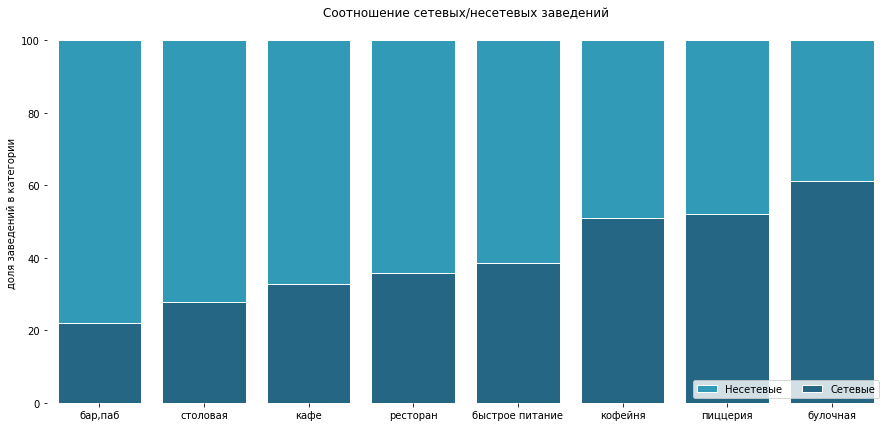

In [76]:
# создание графика
f, ax = plt.subplots(figsize=(15,7))
sns.barplot(x='category', y='share_total', data=chain_category, 
            label = 'Несетевые', color = '#19A7CE', edgecolor = 'w')
sns.set_color_codes('muted')
sns.barplot(x='category', y='share_ch', data=chain_category,
            label = 'Сетевые', color = '#146C94', edgecolor = 'w')
ax.set_title('Соотношение сетевых/несетевых заведений')
ax.set_xlabel('') 
ax.set_ylabel('доля заведений в категории')
ax.legend(ncol = 2, loc = 'lower right')
sns.despine(left = True, bottom = True)
plt.show()

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>Более 60% объектов - несетевые, то есть их доля преобладает. </li>	
<li>Больше всего сетевых заведений среди булочных, 61% На втором месте пиццерии и кофейни - среди них доля сетевых почти 52% и 51%.</li>	
<li>Реже всего бары и пабы становятся сетевыми (доля сетевых - 22%). Как правило, такие заведения создают скорее аутентичными и тематическими.</li> 
    <li>При этом по абсолютному числу сетевых заведений лидируют кафе, ресторан и кофейня.</li> 
</div>

### Топ-15 популярных сетей в Москве

In [28]:
# распределение числа точек заведений в городе
size = data.query('chain == 1').groupby('name')['lat'].count().reset_index()
size['lat'].describe(percentiles=[.08, .25, .50, .75, .90, .95, .99])

count    745.000000
mean       4.302013
std        8.544558
min        1.000000
8%         1.000000
25%        2.000000
50%        2.000000
75%        3.000000
90%        6.000000
95%       13.800000
99%       43.120000
max      120.000000
Name: lat, dtype: float64

Около 8% сетевых заведений имеют один объект на территории Москвы. Вероятно, другие точки расположены в других городах.  
Не более 10% сетевых заведений имеют более 6 точек. И около 1% - более 43 точек.    
Среднее количество точек в сети - 4, а максимальное - 120.

In [29]:
# топ-15 популярных сетей в Москве
popular_name = data.query('chain==1')\
    .pivot_table(index=['name'], columns='category', 
                 values='lat', aggfunc='count', fill_value=0)\
    .reset_index()\
    .reset_index(drop=True)

popular_name['total'] = popular_name.sum(axis= 1)
popular_name = popular_name.sort_values(by='total', ascending=False)[:15]

popular_name

category,name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
729,шоколадница,0,0,0,1,119,0,0,0,120
335,домино'с пицца,0,0,0,0,0,76,0,0,76
331,додо пицца,0,0,0,0,0,74,0,0,74
146,one price coffee,0,0,0,0,71,0,0,0,71
742,яндекс лавка,0,0,0,0,0,0,69,0,69
58,cofix,0,0,0,0,65,0,0,0,65
168,prime,0,0,0,1,0,0,49,0,50
665,хинкальная,3,0,6,19,0,0,15,1,44
411,кофепорт,0,0,0,0,42,0,0,0,42
420,кулинарная лавка братьев караваевых,0,0,0,39,0,0,0,0,39


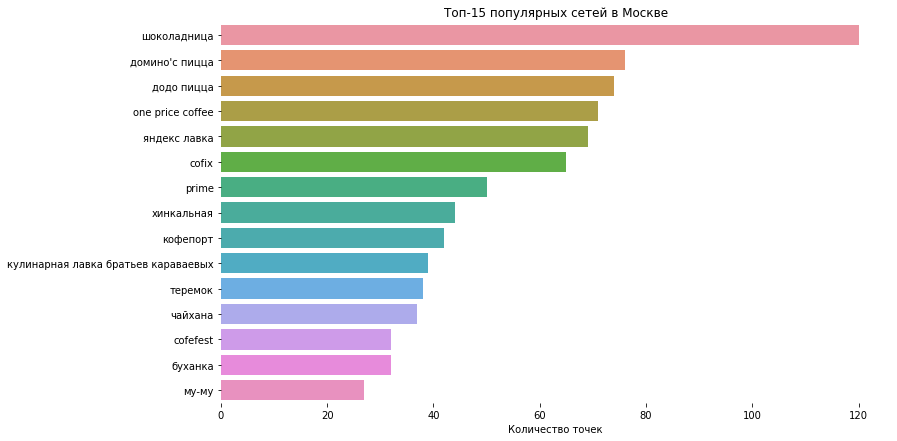

In [30]:
# построение диаграммы распределения популярных сетей
sns.set_palette('Set2')
plt.figure(figsize=(12,7))
ax = sns.barplot(x='total', y='name', data=popular_name, ci=None, 
                 )
ax.set_title('Топ-15 популярных сетей в Москве')
ax.set_xlabel('Количество точек') 
ax.set_ylabel('')
sns.despine(left = True, bottom = True)
plt.show()

Самые популярные сетки представлены кофейнями, ресторанами, кафе, пиццериями и одной булочной.  
Самая популярная - шоколадница. Это явный лидер.

In [31]:
# топ-15 популярных сетей в Москве и их параметры
top_rating = data.query('chain==1')\
                 .groupby('name').agg({'rating':'median', 
                                        'seats':'median',
                                        'middle_avg_bill':'median'})\
                 .reset_index()


popular_name = popular_name.merge(top_rating, on='name')
popular_name

,name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total,rating,seats,middle_avg_bill
0,шоколадница,0,0,0,1,119,0,0,0,120,4.20,96.0,650.0
1,домино'с пицца,0,0,0,0,0,76,0,0,76,4.20,40.0,500.0
2,додо пицца,0,0,0,0,0,74,0,0,74,4.30,52.0,391.5
3,one price coffee,0,0,0,0,71,0,0,0,71,4.20,99.5,NaN
4,яндекс лавка,0,0,0,0,0,0,69,0,69,4.00,46.0,NaN
5,cofix,0,0,0,0,65,0,0,0,65,4.10,87.5,NaN
6,prime,0,0,0,1,0,0,49,0,50,4.20,96.0,300.0
7,хинкальная,3,0,6,19,0,0,15,1,44,4.40,60.0,1000.0
8,кофепорт,0,0,0,0,42,0,0,0,42,4.20,85.0,NaN
9,кулинарная лавка братьев караваевых,0,0,0,39,0,0,0,0,39,4.40,70.0,450.0


Из таблицы видно, что топ-15 заведений имеют рейтинги в диапазоне от 4.05 до 4.4. Хороший показатель.  
Это небольшие по размеру заведения, так как число посадочных мест не превышает 100. Исключение - му-му.  
Данные по среднему чеку неполные.

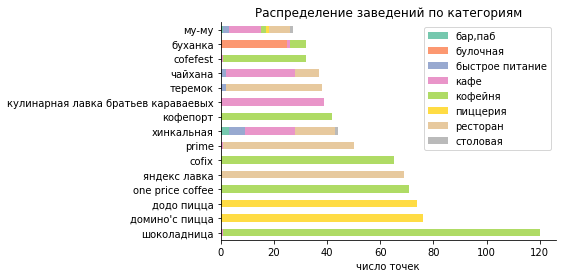

In [32]:
# построение графика распределения топ-15 заведений по категориям
plt.figsize=(17,12)
popular_name.loc[:,'name':'столовая']\
              .set_index('name')\
              .plot.barh(stacked=True, alpha=0.9)

plt.title('Распределение заведений по категориям')
plt.xlabel('число точек') 
plt.ylabel('')
sns.despine()
plt.show()

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>Самые популярные сетки представлены кофейнями, ресторанами, кафе, пиццериями и одной булочной.</li>	
<li>Самая популярная - шоколадница. Следом идут - домино'с пицца, додо пицца, one price coffee, яндекс лавка. Топ-5 самых популярных.</li>	
<li>Самые популярные сети имеют рейтинги от 4-4.4, небольшое количество посадочных мест - до 100.</li> 
</div>

### Административные районы Москвы 

In [33]:
# создание сводной таблицы с административными районами и категориями
district_table = data\
    .pivot_table(index=['district'], columns='category', values='lat', aggfunc='count')\
    .reset_index()

district_table['total'] = district_table.sum(axis= 1)
district_table.sort_values(by='total', inplace=True)

district_table

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
1,Западный административный округ,50,37,62,239,150,71,218,24,851
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
8,Южный административный округ,68,25,85,264,131,73,202,44,892
2,Северный административный округ,68,39,58,235,193,77,188,41,899
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242


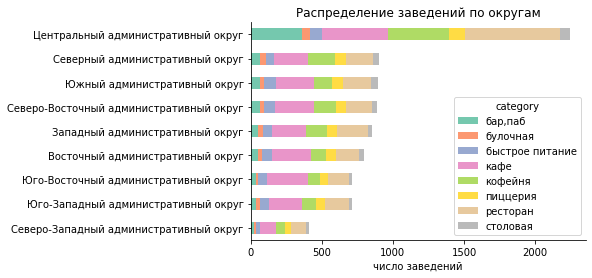

In [34]:
# построение графика распределения заведений по округам
plt.figsize=(17,12)
district_table.loc[:,'district':'столовая']\
              .set_index('district')\
              .plot.barh(stacked=True, alpha=0.9)

plt.title('Распределение заведений по округам')
plt.xlabel('число заведений') 
plt.ylabel('')
sns.despine()
plt.show()

In [87]:
# создание функции для короткого названия округа
def dist_short(row):
    arr_district = row['district'].split(' ')
    #dist = arr_district[0][0]
    dist = arr_district[0]
    return dist+' АО'

# применение функции и создание нового столбца
data['district_short'] = data.apply(dist_short, axis=1)

In [86]:
# график параллельных категорий для ЦАО
fig = px.parallel_categories(data.query('district == "Центральный административный округ"'), 
                       dimensions=['district_short', 'category'], title='Распределение категорий в ЦАО')
fig.show()
 

In [88]:
# график параллельных категорий для САО
px.parallel_categories(data.query('district == "Северный административный округ"'), 
                       dimensions=['district_short', 'category'], title='Распределение категорий в САО')

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>В данных присутствует 9 административных районов(в порядке убывания точек): Центральный, Северный, Южный, Северо-Восточный, Западный, Восточный, Юго-Восточный, Юго-Западный, Северо-Западный.</li>	
<li>Основная часть заведений расположена в Центральном округе, это безусловный лидер, меньше всего объектов - в Северо-Западном округе.</li>	
<li>Северный, Южный и Северо-Восточный АО имеют примерно одинаковое число заведений.</li>
<li>В ЦАО чаще всего открывают рестораны, следом - кафе, кофейни и бары.</li> 
<li>В остальных районах преобладают кафе, следом - рестораны и кофейни.</li> 
<li>Столовые, булочные и точки быстрого питания не очень популярны во всех районах, их крайне мало.</li>
</div>

### Распределение рейтингов по категориям

In [37]:
# создание сводной таблицы с рейтингами и категориями
rating_table = round(data\
    .pivot_table(index=['category'], values='rating', aggfunc='mean')\
    .reset_index(),2)

rating_table.sort_values(by='rating', inplace=True)

rating_table

,category,rating
2,быстрое питание,4.05
3,кафе,4.12
7,столовая,4.21
1,булочная,4.27
4,кофейня,4.28
6,ресторан,4.29
5,пиццерия,4.30
0,"бар,паб",4.39


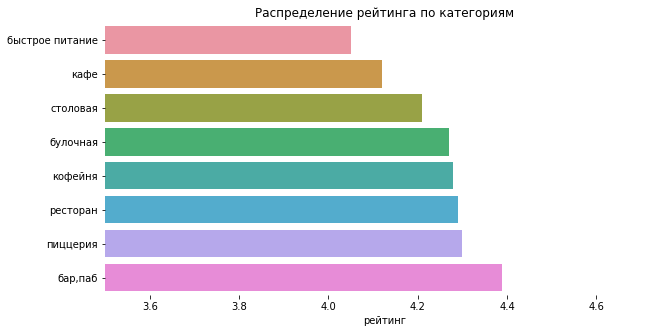

In [38]:
# построение диаграммы распределения рейтингов по категориям
sns.set_palette('husl')
plt.figure(figsize=(10,5))
ax = sns.barplot(x='rating', y='category', data=rating_table, ci=None, 
                 )
plt.xlim(3.5, 4.75)
ax.set_title('Распределение рейтинга по категориям')
ax.set_xlabel('рейтинг') 
ax.set_ylabel('')
sns.despine(left = True, bottom = True)
plt.show()

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>Выше всего пользователи оценивают бары и пабы - 4.39.</li>	
<li>Заведения быстрого питания получают средний рейтинг - 4.05, что является самым низким значением из всех категорий.</li>	
<li>Пиццерия, ресторан, кофейня, булочная имеют примерно одинаковый рейтинг - 4,28-4.29.</li>
</div>

### Средний рейтинг заведений каждого района

Для каждого округа посчитаем средний рейтинг заведений, которые находятся на его территории:

In [39]:
# создание сводной таблицы со средними рейтингами
rating_df = round(data.groupby('district', as_index=False)['rating'].agg('mean')\
                  .sort_values(by='rating'), 2)
rating_df

,district,rating
6,Юго-Восточный административный округ,4.10
3,Северо-Восточный административный округ,4.15
7,Юго-Западный административный округ,4.17
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
8,Южный административный округ,4.18
4,Северо-Западный административный округ,4.21
2,Северный административный округ,4.24
5,Центральный административный округ,4.38


In [40]:
# сохранение JSON-файла с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng],  zoom_start=10)

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>Самый высокий рейтинг у заведений в ЦАО, следом идут - Северный и Северно-Западный АО, а самый низкий рейтинг у заведений в Юго-Восточном АО.</li>	

</div>

### Заведения на карте

In [41]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_cluster(row):
    Marker([row['lat'], row['lng']], 
           popup=f"{row['name']}{row['rating']}").add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
data.apply(create_cluster, axis=1)

m

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>На карте видно, как расположены заведения города. Большее количество заведений тяготеют к центру или югу города.</li>	
<li>Вблизи МКАДа в Западном АО разместилось одно заведение - кафе 3.8.</li>
</div>

### Топ-15 улиц по количеству заведений

In [42]:
# топ-15 улиц по количеству заведений в Москве
popular_street = data\
    .pivot_table(index=['street'], columns=['category'], 
                 values='lat', aggfunc='count', fill_value=0)\
    .reset_index()\
    .reset_index(drop=True)

popular_street['total'] = popular_street.sum(axis= 1)
popular_street = popular_street.sort_values(by='total', ascending=False)[:15]

popular_street

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
1090,проспект Мира,12,4,21,53,36,11,45,2,184
773,Профсоюзная улица,6,4,15,35,18,15,26,3,122
1087,проспект Вернадского,7,1,12,25,16,12,33,2,108
525,Ленинский проспект,10,3,2,26,23,5,33,5,107
523,Ленинградский проспект,15,4,2,12,25,9,25,3,95
373,Дмитровское шоссе,6,2,10,23,11,8,24,4,88
455,Каширское шоссе,2,0,10,20,16,5,19,5,77
298,Варшавское шоссе,6,0,7,18,14,4,20,7,76
524,Ленинградское шоссе,5,2,5,13,13,3,26,3,70
550,МКАД,1,0,9,45,4,0,5,1,65


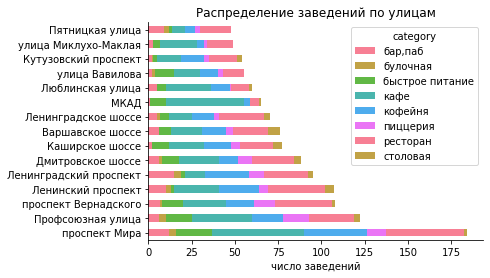

In [43]:
# построение графика распределения заведений по улицам
plt.figsize=(17,12)
popular_street.loc[:,'street':'столовая']\
              .set_index('street')\
              .plot.barh(stacked=True, alpha=0.9)

plt.title('Распределение заведений по улицам')
plt.xlabel('число заведений') 
plt.ylabel('')
sns.despine()
plt.show()

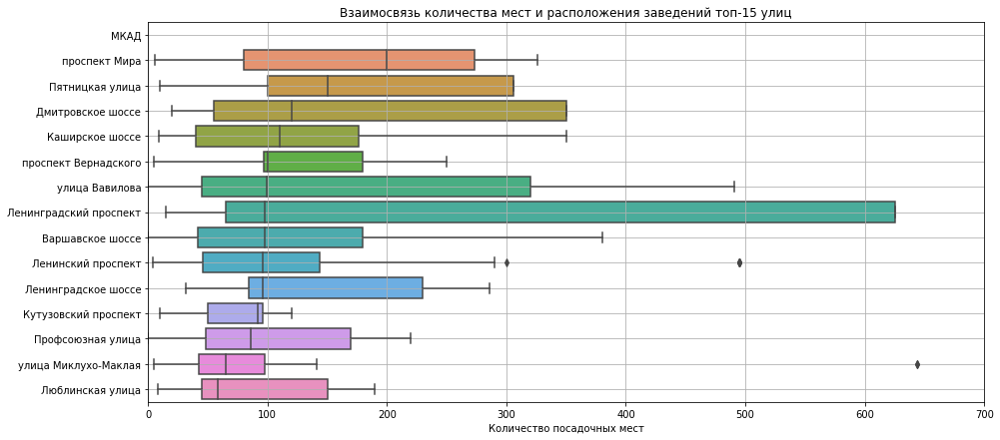

In [44]:
# график распределения количества мест в топ-15 улицах
order = data.query('street in @popular_street.street')\
            .groupby("street")["seats"].median().sort_values()[::-1].index
plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='street', data=data.query('street in @popular_street.street'),
           order = order) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('')
plt.xlim(0, 700)
plt.grid()
plt.title('Взаимосвязь количества мест и расположения заведений топ-15 улиц')
plt.show()

In [45]:
# график параллельных категорий для проспекта Мира
px.parallel_categories(data.query('street == "проспект Мира"'), 
                       dimensions=['street', 'category'])

In [46]:
# график параллельных категорий для МКАДа
px.parallel_categories(data.query('street == "МКАД"'), 
                       dimensions=['street', 'category'])

Вместимость большинства заведений на самых популярных улицах очень вариативна. Медианное число мест колеблется от 50 до 100, и не превышает 200 посадочных мест.  
На проспекте Мира самое высокое медианное значение, в среднем заведения имеют около 200 посадочных мест.  
На Ленинградском проспекте, Дмитровском шоссе и улице Вавилова можно встретить множество заведений разного размера, здесь большой разброс данных, но в основном заведения имеют от 50 до 100 мест.  
На улице Миклухо-Маклая медианное число мест около 60, но при этом есть одно заведение, где около 650 посадочных мест.  
Самые маленькие заведения по размещению - на Люблинской улице, около 50 мест в большинстве заведений.

 Можно заметить, что больше всего заведений на самых длинных улицах, огромных проспектах, шоссе, разбегающихся от Садового кольца к краям города и проходящих по нескольким районам.

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>Большее число заведений расположено на проспекте Мира(ЦАО), следом идут - Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект.</li>
<li>Замыкают топ улица Миклухо-Маклая и Пятницкая улица.</li>	
<li>Если говорить о распределении категорий заведений на этих улицах, то видно, что везде преобладают кафе, рестораны и кофейни.</li>	
<li>На МКАДе подавляющее большинство заведений - кафе, следом - быстрое питание, а вот ресторанов и кофеен крайне мало. Булочных и пиццерий тут нет.</li> 
<li>На Ленинском проспекте, Ленинградском проспекте и проспекте Мира пабов и баров больше, чем на других улицах.</li> 
<li>Столовые, булочные и пиццерии не очень распространены на всех этих улицах, их крайне мало.</li>
<li>Медианное число посадочных мест на этих улицах колеблется от 50 до 100</li>
</div>

### Улицы с одним объектом общепита

In [47]:
# таблица с улицами, где расположен 1 объект общепита
low_street = data.groupby('street')['lat'].count()\
            .sort_values(ascending=True).reset_index().query('lat == 1')

low_street.set_axis(['street', 'count'], axis = 'columns', inplace=True)
len(low_street)

458

In [48]:
# группировка по округам
low_street = low_street\
            .merge(data[['street','district']], 
                         on='street', how='left')[['street','district']]
low_street = low_street.groupby('district').agg('count').sort_values(by='street')
low_street= low_street.reset_index()
low_street

,district,street
0,Юго-Западный административный округ,18
1,Северо-Западный административный округ,19
2,Западный административный округ,35
3,Юго-Восточный административный округ,39
4,Южный административный округ,43
5,Восточный административный округ,52
6,Северный административный округ,52
7,Северо-Восточный административный округ,55
8,Центральный административный округ,145


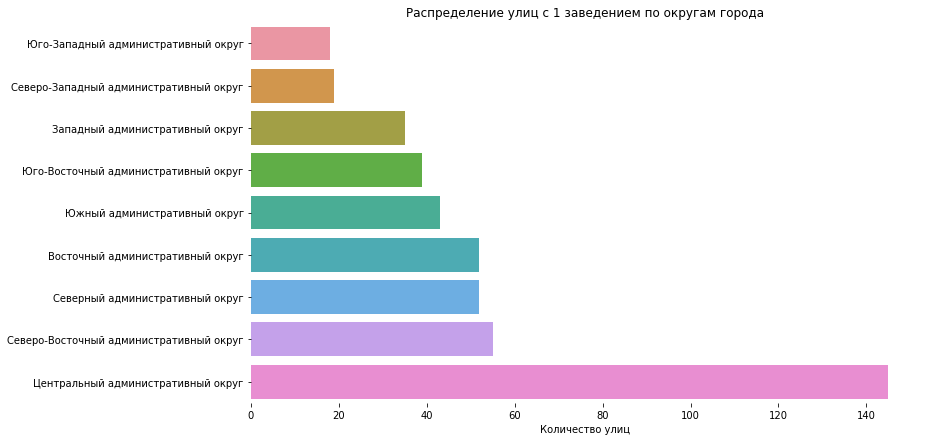

In [49]:
# график распределения улиц с 1 заведением по округам
sns.set_palette('Set2')
plt.figure(figsize=(12,7))
ax = sns.barplot(x='street', y='district', data=low_street, ci=None, 
                 )
ax.set_title('Распределение улиц с 1 заведением по округам города')
ax.set_xlabel('Количество улиц') 
ax.set_ylabel('')
sns.despine(left = True, bottom = True)
plt.show()

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br>
<li>В данных присутствует 458 улиц, на которых расположен только 1 объект общественного питания.</li>  
<li>Из таблицы сразу видно, что большая часть улиц с 1 заведением расположены в ЦАО, причем с отрывом от остальных округов - 145 улиц. Ранее было отмечено, что этот округ в целом лидирует по числу объектов питания, поэтому данный факт не удивителен.</li>  
<li>Меньшего всего таких улиц в Юго-Западном и Северо-Западном АО.</li>  
</div>

### Удалённость от центра и цены в заведениях

Для каждого округа посчитаем средний чек заведений, которые находятся на его территории:

In [50]:
# создание сводной таблицы со средними чеками
avg_bill_df = round(data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')\
                  .sort_values(by='middle_avg_bill'), 2)
avg_bill_df

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
0,Восточный административный округ,575.0
7,Юго-Западный административный округ,600.0
2,Северный административный округ,650.0
4,Северо-Западный административный округ,700.0
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0


In [51]:
# создание карты Москвы
m_bill = Map(location=[moscow_lat, moscow_lng],  zoom_start=10)

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m_bill)

# выводим карту
m_bill

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>Самый высокий средний чек в Центральном и Западном АО. Это явные лидеры.</li>
<li>Следом идет Северный АО.</li>  
<li>Самый низкий средний чек в Юго-Восточном АО.</li>
</div>

Исследуем, как меняется средний чек заведения в зависимости от удаленности от центра

In [52]:
# создание функции подсчета расстояния от заведения до центра города
def count_distance(row):
    Moscow = (55.751244, 37.618423)
    name = (row['lat'], row['lng'])
    dist = round(GD(Moscow, name).km)
    return dist

data['distance'] = data.apply(count_distance, axis=1)

In [53]:
# создание сводной таблицы со средним чеком каждого км
distance_pivot = data.pivot_table(index='distance', 
                                  values='middle_avg_bill', 
                                  aggfunc='median')
distance_pivot.head(5)

,middle_avg_bill
distance,
0,1175.0
1,1250.0
2,1250.0
3,850.0
4,825.0


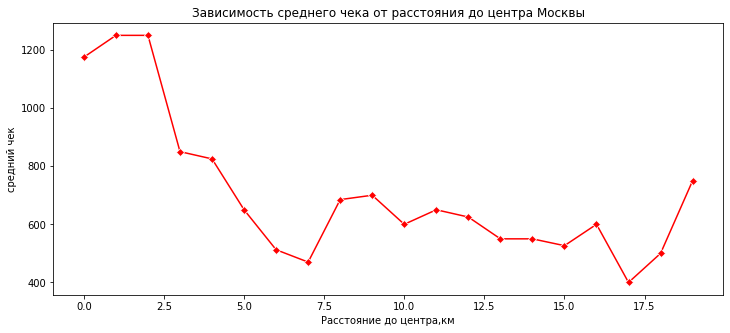

In [54]:
# построение линейного графика зависимости расстояния до центра и средним чеком
sns.set_palette('Set2')
plt.figure(figsize=(12,5))
sns.lineplot(x = distance_pivot.index, y = 'middle_avg_bill', 
             data = distance_pivot, color='red', marker='D')
plt.xlabel('Расстояние до центра,км')
plt.ylabel('средний чек')
plt.title('Зависимость среднего чека от расстояния до центра Москвы')
plt.show()

In [55]:
# рассчет коэффициента Пирсона
corr_dist = data[['middle_avg_bill',\
                  'distance'
               ]].corr()
corr_dist.style.background_gradient(cmap='coolwarm')

,middle_avg_bill,distance
middle_avg_bill,1.000000,-0.164010
distance,-0.164010,1.000000


<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>На графике и по данным таблицы видно, что самые высокие чеки можно встретить в пределах двух километрах от центра 1000-1300рублей.</li>   
<li>Начиная с 2.5км средний чек резко падает до 850рублей. И продолжает свое падение до 7 км от центра, достигая 470 рублей.</li>   
<li>Затем отмечается рост чека и его стабилизация, он колеблется от 550 до 650 рублей вплоть до 16.5 км от центра. На 17км чек снова опускается до 400рублей, а затем начинается его рост.</li>   
<li>Таким образом, чем дальше от центра, тем в среднем чек будет ниже. Имеет место отрицательная корреляционная зависимость. Коэффициент Пирсона показывает наличие очень слабой зависимости, он равен -0.16. </li>   
<li>Сильнее всего влияние расстояния на чек отмечено в пределах первых 7км от центра, это видно и в сводной таблице, и на линейном графике. Здесь 1км. снижает чек на 11.5%.</li>  
<li>В пределах от 7.5км до 16км от центра средний чек колеблется в одном диапазоне и 1км. повышает чек на 4%.</li> 
<li>На расстоянии от 16.5км от центра 1км. повышает чек на 14%.</li> 
<li>Конечно, влияние близости к центру на средний чек есть, но степень влияния снижается при увеличении этого расстояния, то есть сила корреляции будет снижаться. Скорее всего, на расстоянии свыше 7км. большее влияние на чек приобретают другие факторы.</li> 
</div>

In [56]:
# создание таблицы с средним расстоянием до центра в районах
data.pivot_table(index='district', values='distance', 
                 aggfunc='median').sort_values(by='distance')

,distance
district,
Центральный административный округ,3
Восточный административный округ,10
Западный административный округ,11
Северный административный округ,11
Северо-Восточный административный округ,11
Юго-Восточный административный округ,11
Юго-Западный административный округ,11
Южный административный округ,12
Северо-Западный административный округ,14


In [57]:
# функция создания графика, таблицы и рассчета корреляции по округам города
def distance_corr(dist):
    # создание сводной таблицы со средним чеком каждого км
    distance = data.query('district==@dist')\
                     .pivot_table(index='distance', 
                                  values='middle_avg_bill', 
                                  aggfunc='median')
    # построение линейного графика зависимости расстояния до центра и средним чеком 
    sns.set_palette('Set2')
    plt.figure(figsize=(12,5))
    sns.lineplot(x = distance.index, y = 'middle_avg_bill', 
             data = distance,  marker='D')
    plt.xlabel('Расстояние до центра,км')
    plt.ylabel('средний чек')
    plt.title(f'Зависимость среднего чека от расстояния до центра {dist}')
    plt.show()
    
    # рассчет коэффициента Пирсона
    corr_dist = data.query('district==@dist')\
       [['middle_avg_bill','distance']].corr()
    
    
    display(distance)
    display(corr_dist)

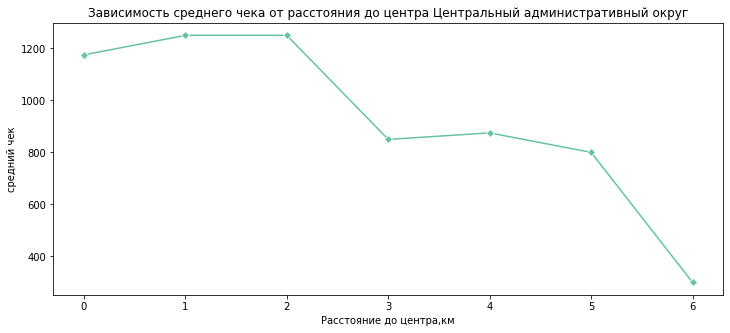

,middle_avg_bill
distance,
0,1175.0
1,1250.0
2,1250.0
3,850.0
4,875.0
5,800.0
6,300.0


,middle_avg_bill,distance
middle_avg_bill,1.000000,-0.169097
distance,-0.169097,1.000000


In [58]:
distance_corr('Центральный административный округ')

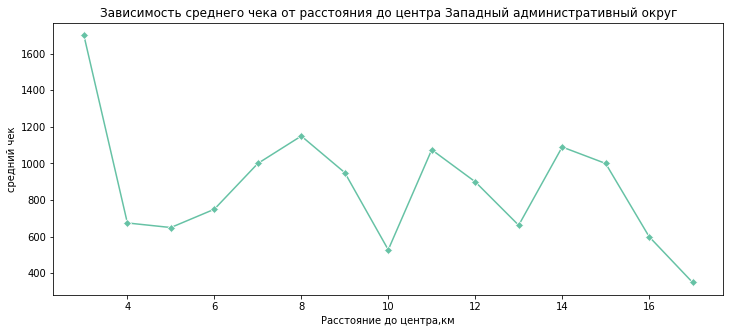

,middle_avg_bill
distance,
3,1700.0
4,675.0
5,650.0
6,750.0
7,1000.0
8,1150.0
9,950.0
10,528.5
11,1075.0


,middle_avg_bill,distance
middle_avg_bill,1.000000,-0.142108
distance,-0.142108,1.000000


In [59]:
distance_corr('Западный административный округ')

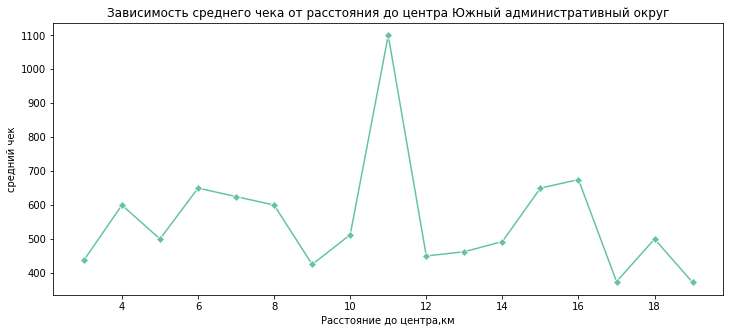

,middle_avg_bill
distance,
3,437.5
4,600.0
5,500.0
6,650.0
7,625.0
8,600.0
9,425.0
10,512.5
11,1100.0


,middle_avg_bill,distance
middle_avg_bill,1.000000,-0.019559
distance,-0.019559,1.000000


In [60]:
distance_corr('Южный административный округ')

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>Рассмотрев несколько графиков по разным районам с разной удаленностью от центра, отмечается явная зависимость в Центральном АО, здесь четко видно, как с каждым километром падает средний чек. Коэффициент корреляции - 0.17. То есть с увеличением расстояния от центра уменьшается средний чек. Зависимость обратная и слабая.</li> 
<li>В Западном административном округе корреляция -0.14. В начале графика видно, как чек падает с каждым километром, но по мере роста километража величина средннего чека начинает скакать, независимо от расстояния.</li>   
<li>Самый низкий коэффициент корреляции - в Южном АО. Всего -0.02. Здесь в заведениях удаленность от центра практически никак не влияет на размер чека.</li> 
<li>Делаем вывод, что на средний чек удаленность от центра имеет влияние в пределах первых 7 км., затем на средний чек начинают воздействовать другие факторы.</li>     
</div>

## Общий вывод

<p></p>

<div style="border:solid pink 5px; padding: 20px">
<b><span style="color:#FF78C4">Категории объектов общественного питания:</span></b>
<li>Заведения представлены в 8 категориях: булочная, столовая, быстрое питание, пиццерия; бар,паб; кофейня, ресторан, кафе.</li>
<li>Кафе - наибольшая доля: около 28%, следом рестораны - 24% и кофейни - 17%.</li>
<li>Бары заняли 9% всех заведений, пиццерии - 7.5%, объекты быстрого питания - 7.2%</li> 
<li>Меньше всего булочных и столовых - 3.1% и 3.8%.</li> 
    
<b><span style="color:#FF78C4">Посадочные места:</span></b>
<li>В Москве заведения с широким диапазоном посадочных мест(от нуля до 1288 мест)</li>
<li>Основная доля объектов являются небольшими или средними по размеру - 50-200 мест, крупных сетей мало.</li>
<li>Среднее число мест - 108, а медианное - 75. </li>
<li>Список категорий, отсортированный по количеству посадочных мест (по убыванию) - бар, ресторан, кофейня, столовая, быстрое питание, кафе, пиццерия, булочная</li>
   
    
<b><span style="color:#FF78C4">Сетевые/несетевые заведения:</span></b>
<li>Более 60% объектов - несетевые, их доля преобладает.</li>
<li>Больше всего сетевых заведений среди булочных, 61% всех булочных - сетевые На втором месте пиццерии и кофейни - среди них доля сетевых почти 52% и 51%.</li>
<li>Реже всего бары и пабы становятся сетевыми (доля сетевых - 22%).</li> 


<b><span style="color:#FF78C4">Популярные сети:</span></b>
<li>Самые популярные сетки представлены кофейнями, ресторанами, кафе, пиццериями и одной булочной.</li>
<li>Самая популярная сеть - шоколадница. Следом идут - домино'с пицца, додо пицца, one price coffee, яндекс лавка. Топ-5 самых популярных.</li>
<li>Самые популярные сети имеют рейтинги от 4-4.4, небольшое количество посадочных мест - до 100.</li>
    
    
<b><span style="color:#FF78C4">Расположение объектов общественного питания по округам:</span></b>
<li>Основная часть заведений расположена в Центральном округе, это безусловный лидер, меньше всего объектов - в Северо-Западном округе.</li>
<li>Северный, Южный и Северо-Восточный АО имеют примерно одинаковое число заведений.</li>
<li>В ЦАО чаще всего открывают рестораны, следом - кафе, кофейни и бары.</li>
<li>В остальных районах преобладают кафе, следом - рестораны и кофейни.</li>
<li>Столовые, булочные и точки быстрого питания не очень популярны во всех районах, их крайне мало.</li>    
    
    
<b><span style="color:#FF78C4">Расположение объектов общественного питания по улицам:</span></b>
<li>Большее число заведений расположено на проспекте Мира(ЦАО), следом идут - Профсоюзная улица(ЮЗАО), проспект Вернадского(ЗАО), Ленинский проспект(ЮАО), Ленинградский проспект(САО).</li>
<li>Замыкают топ-15 улица Миклухо-Маклая и Пятницкая улица.</li>
<li>На всех улицах преобладают кафе, рестораны и кофейни, а столовых, булочных и пиццерий мало.</li> 
<li>Медианное число посадочных мест на этих улицах колеблется от 50 до 100.</li> 
<li>На 458 улицах расположен только 1 объект общественного питания.</li>
<li>Большая часть улиц с 1 заведением расположены в ЦАО - 145 улиц.</li>
<li>Меньшего всего таких улиц в Юго-Западном и Северо-Западном АО.</li>    
    

<b><span style="color:#FF78C4">Рейтинг:</span></b>
<li>Самый высокий рейтинг у заведений в ЦАО, следом идут - Северный и Северно-Западный АО, а самый низкий рейтинг у заведений в Юго-Восточном АО.</li>
<li>Выше всего пользователи оценивают бары и пабы - 4.39.</li>
<li>Заведения быстрого питания получают самый низкий рейтинг - 4.05</li>
<li>Пиццерия, ресторан, кофейня, булочная имеют примерно одинаковый рейтинг - 4,28-4.29.</li>
    
    
    
<b><span style="color:#FF78C4">Средний чек и расстояние до центра:</span></b>    
<li>Самый высокий средний чек в Центральном и Западном АО - 1191 и 1053 рубля.</li>
<li>Самый низкий средний чек в Юго-Восточном АО - 654 рубля.</li>
<li>На средний чек удаленность от центра имеет влияние в пределах первых 7 км., затем на средний чек начинают воздействовать другие факторы.</li>
    
    
    
    
</div>

## Исследование: открытие кофейни

In [61]:
# общее количество кофеен
len(data.query('category=="кофейня"'))

1413

In [62]:
# распределение кофеен по районам
cafe = data.query('category=="кофейня"').groupby('district')\
       .agg({'lat':'count', 'rating':'mean', 'seats':'median'})\
       .sort_values(by='lat', ascending=True).reset_index()
cafe.columns = ['district', 'count', 'rating', 'seats']
cafe

,district,count,rating,seats
0,Северо-Западный административный округ,62,4.325806,87.5
1,Юго-Восточный административный округ,89,4.225843,50.0
2,Юго-Западный административный округ,96,4.283333,64.5
3,Восточный административный округ,105,4.282857,55.0
4,Южный административный округ,131,4.232824,80.0
5,Западный административный округ,150,4.195333,96.0
6,Северо-Восточный административный округ,159,4.216981,75.0
7,Северный административный округ,193,4.291710,66.0
8,Центральный административный округ,428,4.336449,86.0


In [63]:
# функция для хороплета
def create_choropleth(df, n1, n2):
    # создание карты Москвы
    cafe_map = Map(location=[moscow_lat, moscow_lng],  zoom_start=10)

    # создание хороплета с количеством кофеен по округам
    Choropleth(
        geo_data=state_geo,
        data=df,
        columns=['district', n1],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=n2,
    ).add_to(cafe_map)

    # выводим карту
    return cafe_map

In [64]:
# построение карты распределения кофеен по округам
create_choropleth(cafe, 'count', 'Количество кофеен по округам')

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>В данных представлено 1413 кофеен.</li> 
<li>Основная часть сосредоточена в ЦАО - 428 заведений. Явный отрыв.</li>  
<li>Следом идут - Северный АО, СВАО, Западный АО и Южный АО.</li>    
</div>

In [65]:
# построение карты распределения рейтингов кофеен по округам
create_choropleth(cafe, 'rating', 'Рейтинги по округам')

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>Выше всего оценивают кофейни в ЦАО, рейтинг - 4.34, следом - СЗАО (4.33) и САО (4.29).</li> 
<li>Самые низкие рейтинги получили кофейни в ЗАО - 4.20 и СВАО - 4.22.</li>     
</div>

In [66]:
# построение карты распределения посадочных мест кофеен по округам
create_choropleth(cafe, 'seats', 'Количество мест по округам')

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>Больше всего мест в среднем в кофейнях в Западном АО - 96 мест.</li> 
<li>В СЗАО и Центральном АО - 88 и 86 мест в среднем.</li>  
<li>Самые маленькие кофейни располагаются в Восточном и Юго-Восточном АО - 55 и 50 мест.</li>  
</div>

In [67]:
# топ-15 улиц по количеству кофеен в Москве
cafe_street = data.query('category=="кофейня"')\
    .pivot_table(index=['street'], values='lat', aggfunc='count', )\
    .sort_values(by='lat', ascending=False)\
    .reset_index()[:15]

cafe_street

,street,lat
0,проспект Мира,36
1,Ленинградский проспект,25
2,Ленинский проспект,23
3,Профсоюзная улица,18
4,проспект Вернадского,16
5,Каширское шоссе,16
6,Варшавское шоссе,14
7,Кутузовский проспект,13
8,Новослободская улица,13
9,Ленинградское шоссе,13


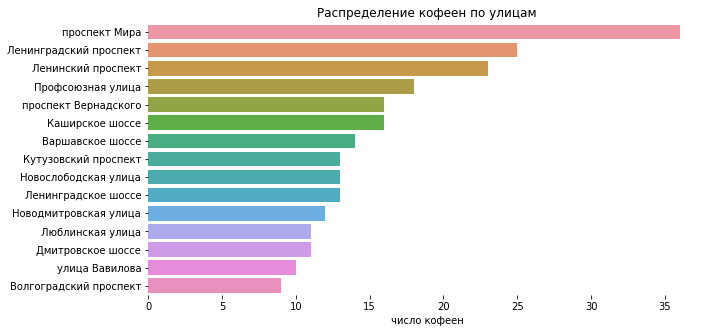

In [68]:
# построение графика распределения кофеен по улицам
sns.set_palette('husl')
plt.figure(figsize=(10,5))
ax = sns.barplot(x='lat', y='street', data=cafe_street, ci=None, 
                 )
ax.set_title('Распределение кофеен по улицам')
ax.set_xlabel('число кофеен') 
ax.set_ylabel('')
sns.despine(left = True, bottom = True)
plt.show()

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>Проспект Мира, Ленинградский проспект, Ленинский проспект - места, где расположилось больше всего кофеен.</li> 
</div>

In [69]:
# таблица с круглосуточными кафе
len(data.loc[(data['is_24/7'] == True) & (data['category'] == "кофейня")])

59

In [70]:
# распределение круглосуточных кофеен по районам и рейтингам
data.loc[(data['is_24/7'] == True) & (data['category'] == "кофейня")]\
    .groupby('district').agg({'lat':'count', 'rating':'median'}).\
       sort_values(by='lat', ascending=True).reset_index()

,district,lat,rating
0,Юго-Восточный административный округ,1,2.30
1,Южный административный округ,1,4.00
2,Северо-Западный административный округ,2,4.25
3,Северо-Восточный административный округ,3,4.00
4,Восточный административный округ,5,4.20
5,Северный административный округ,5,4.20
6,Юго-Западный административный округ,7,4.30
7,Западный административный округ,9,4.20
8,Центральный административный округ,26,4.25


In [71]:
# распределение некруглосуточных кофеен по районам и рейтингам
data.loc[(data['is_24/7'] != True) & (data['category'] == "кофейня")]\
    .groupby('district').agg({'lat':'count', 'rating':'median'}).\
       sort_values(by='lat', ascending=True).reset_index()

,district,lat,rating
0,Северо-Западный административный округ,60,4.3
1,Юго-Восточный административный округ,88,4.3
2,Юго-Западный административный округ,89,4.3
3,Восточный административный округ,100,4.3
4,Южный административный округ,130,4.3
5,Западный административный округ,141,4.2
6,Северо-Восточный административный округ,156,4.3
7,Северный административный округ,188,4.3
8,Центральный административный округ,402,4.3


<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>В данных встречается всего 59 круглосуточных кофеен, их немного, на что оказал влияние сам формат заведения. 44% из них сосредоточены в Центральном АО. </li> 
<li>Рейтинг у круглосуточных кофеен ниже, чем у некруглосуточных.</li> 
</div>

In [72]:
# создание сводной таблицы со средними чеками в кофейнях
cafe_bill_avg = data.groupby('district').agg({'middle_avg_bill':'median',
                                             'middle_coffee_cup':'median'})\
                  .sort_values(by='middle_avg_bill').reset_index()
cafe_bill_avg

,district,middle_avg_bill,middle_coffee_cup
0,Юго-Восточный административный округ,450.0,145.0
1,Северо-Восточный административный округ,500.0,162.5
2,Южный административный округ,500.0,149.5
3,Восточный административный округ,575.0,135.0
4,Юго-Западный административный округ,600.0,197.0
5,Северный административный округ,650.0,159.0
6,Северо-Западный административный округ,700.0,150.0
7,Западный административный округ,1000.0,187.0
8,Центральный административный округ,1000.0,190.0


In [73]:
# создание хороплета стоимости чашки кофе в кофейнях по районам
create_choropleth(cafe_bill_avg, 'middle_coffee_cup', 'Средняя стоимость чашки кофе')

<div style="border:solid red 1px; padding: 20px"> 
    <b><i>Вывод:</i></b><br> 
<li>Дороже всего будет стоить кружка кофе в Юго-западном, Центральном и Западном АО - 197руб, 190руб, 187руб</li>
<li>Самый высокий средний чек - в Центральном и Западном АО - 1000руб.</li>
</div>

<p></p>

<div style="border:solid pink 5px; padding: 20px">
<b><span style="color:#FF78C4">Рекомендации:</span></b>   

<li>Открывать кофейню рекомендуется в Центральном районе, наибольшее количество существующих кофеен сосредоточено именно там. Это округ с высоким пешеходным трафиком, средним чеком и рейтингом.</li>
<li>Улицы ЦАО для заведения - проспект Мира, Новослободская улица. Здесь много кофеен.</li>
<li>Количество посадочных мест чуть ниже среднего - в районе 50.</li>
<li>Не стоит открывать круглусуточную кофейню, у круглосуточных заведений пусть немного, но все же рейтинги ниже, чем у некроглосуточных кофеен.</li>
<li>Чашка кофе должна стоить в районе 190 рублей, а средний чек - в районе 1000 рублей.</li>
</div>

## Презентация

Презентация: https://disk.yandex.ru/i/rhtmys7bSUj3Jg